- id: A unique identifier for each individual or record.
- person_age: The age of the individual.
- person_income: The annual income of the individual.
- person_home_ownership: The homeownership status of the individual (e.g., "rent", "own", "mortgage").
- person_emp_length: Length of employment in years.
- loan_intent: The purpose of the loan (e.g., "personal", "education", "home improvement").
- loan_grade: The grade assigned to the loan based on creditworthiness (e.g., A, B, C).
- loan_amnt: The loan amount requested or granted.
- loan_int_rate: The interest rate of the loan (likely in percentage form).
- loan_percent_income: The percentage of the person's income allocated toward loan payments.
- cb_person_default_on_file: Indicates if the individual has a history of defaulting on credit (e.g., "Y" for yes, "N" for no).
- cb_person_cred_hist_length: The length of the individual's credit history in years.
- loan_status: The status of the loan  
  * 0: Loan application was denied or defaulted.
  * 1: Loan application was approved or paid successfully.

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report ,confusion_matrix , ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from imblearn.combine import SMOTEENN
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from scipy.stats import uniform, randint

# <span style="color:skyblue">1-Load data</span>

In [36]:
df=pd.read_csv('Loan approval prediction.csv')

In [37]:
df_copy=df.copy()

In [4]:
df_copy.head(5)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [6]:
df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [7]:
df.describe(include='object')

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
count,58645,58645,58645,58645
unique,4,6,7,2
top,RENT,EDUCATION,A,N
freq,30594,12271,20984,49943


In [8]:
objcols = df.select_dtypes(include=['O', 'category']).columns
for col in objcols:
    print('='*40)
    print(df[col].value_counts())

person_home_ownership
RENT        30594
MORTGAGE    24824
OWN          3138
OTHER          89
Name: count, dtype: int64
loan_intent
EDUCATION            12271
MEDICAL              10934
PERSONAL             10016
VENTURE              10011
DEBTCONSOLIDATION     9133
HOMEIMPROVEMENT       6280
Name: count, dtype: int64
loan_grade
A    20984
B    20400
C    11036
D     5034
E     1009
F      149
G       33
Name: count, dtype: int64
cb_person_default_on_file
N    49943
Y     8702
Name: count, dtype: int64


In [9]:
objcols = df.select_dtypes(include=["int64",'float64']).columns ### There is an imbalance
for col in objcols:
    print('='*40)
    print(df[col].value_counts())

id
0        1
39089    1
39091    1
39092    1
39093    1
        ..
19551    1
19552    1
19553    1
19554    1
58644    1
Name: count, Length: 58645, dtype: int64
person_age
23     7726
22     7051
24     6395
25     5067
27     4450
26     3874
28     3707
29     3270
30     2333
31     1917
21     1795
32     1565
33     1306
36     1117
34     1041
37      992
35      862
38      745
39      536
40      438
41      433
43      320
42      291
44      229
46      164
45      163
47      125
48       97
53       75
51       69
50       63
52       62
54       60
49       59
58       35
55       34
56       29
60       28
57       25
65       13
61       13
20       12
66       11
64       10
70       10
62        7
69        6
59        6
73        3
84        2
80        2
76        1
123       1
Name: count, dtype: int64
person_income
60000     4164
50000     2992
30000     2200
40000     1981
70000     1876
          ... 
48602        1
46151        1
128474       1
43900        

In [10]:
df.isna().sum() #no missing value 

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

# <span style="color:skyblue">2- clean data</span>

1.1 Drop unsefulcolumn

In [38]:
df_copy = df_copy.drop(columns=['id'])  # not useful

In [12]:
# make boxblot to show outlier
num_df=df.select_dtypes(include=['int64','float64']).columns
for col in num_df:
    fig = px.box(num_df, y=df[col])
    fig.update_layout(yaxis_title=col)
    fig.show()

2.2 handling outliers

In [39]:
df_copy = df_copy[(df_copy['person_age'] <= 65) & (df_copy['person_age'] >= 20)]
# Average age of people taking loans from 20 to 65

In [40]:
df[df['person_income']>200000].shape

(244, 13)

In [41]:
df[df['person_income']>200000]

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
91,91,24,225000,RENT,0.0,MEDICAL,C,3000,14.26,0.01,Y,2,0
489,489,24,200100,MORTGAGE,8.0,DEBTCONSOLIDATION,A,30000,7.90,0.15,N,4,0
583,583,22,250000,MORTGAGE,4.0,EDUCATION,A,10000,7.51,0.04,N,3,0
1178,1178,36,280000,RENT,1.0,DEBTCONSOLIDATION,B,10000,11.71,0.04,N,16,0
1260,1260,40,300000,RENT,6.0,DEBTCONSOLIDATION,B,5000,10.37,0.02,N,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
57562,57562,26,450000,MORTGAGE,6.0,MEDICAL,A,14000,7.90,0.03,N,4,0
57780,57780,26,300000,MORTGAGE,10.0,EDUCATION,A,35000,6.62,0.12,N,2,0
57787,57787,35,900000,RENT,2.0,PERSONAL,B,25000,11.49,0.03,N,6,0
58350,58350,25,225000,RENT,5.0,MEDICAL,B,6000,9.99,0.03,N,2,0


In [42]:
df_copy = df_copy[(df_copy['person_income'] <= 200000)]


In [43]:
df_copy = df_copy[(df_copy['person_emp_length'] <= 31)]


In [44]:
df[df['loan_percent_income']>=0.55]

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
21747,21747,36,18000,RENT,0.0,HOMEIMPROVEMENT,E,12000,18.39,0.56,Y,12,1
37533,37533,35,54500,MORTGAGE,19.0,DEBTCONSOLIDATION,B,30000,9.91,0.55,N,5,0
44806,44806,40,14400,RENT,2.0,HOMEIMPROVEMENT,C,8000,14.27,0.56,N,15,1
49179,49179,39,12000,RENT,0.0,PERSONAL,C,16000,10.78,0.83,N,12,1
54980,54980,22,69000,RENT,0.0,VENTURE,D,3775,18.25,0.59,N,4,1
56034,56034,35,40000,OWN,1.0,HOMEIMPROVEMENT,B,25000,11.86,0.63,N,8,0


In [45]:
# The natural ratio of loan_percent_income 

df_copy = df_copy[(df_copy['loan_percent_income'] <= 0.55)]

In [46]:
df[df['cb_person_cred_hist_length']==20]

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
547,547,56,51600,RENT,3.0,PERSONAL,B,15000,10.37,0.29,N,20,0
5113,5113,53,55000,RENT,2.0,EDUCATION,A,10000,8.90,0.18,N,20,0
5614,5614,54,50000,MORTGAGE,6.0,PERSONAL,A,12000,7.90,0.24,N,20,0
5656,5656,51,79894,RENT,1.0,MEDICAL,B,20000,11.83,0.25,N,20,0
5704,5704,56,70000,RENT,3.0,DEBTCONSOLIDATION,B,20000,10.38,0.26,N,20,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
56682,56682,54,80000,MORTGAGE,20.0,MEDICAL,B,12000,10.37,0.15,N,20,0
57522,57522,51,150000,MORTGAGE,14.0,PERSONAL,A,20000,7.90,0.13,N,20,0
57897,57897,57,150000,MORTGAGE,11.0,PERSONAL,C,14000,12.99,0.09,Y,20,0
58552,58552,54,60000,RENT,4.0,PERSONAL,B,8000,10.37,0.13,N,20,0


In [21]:
# make boxblot to show outlier
num_df=df_copy.select_dtypes(include=['int64','float64']).columns
for col in num_df:
    fig = px.box(num_df, y=df[col])
    fig.update_layout(yaxis_title=col)
    fig.show()

### <a id="eda"></a>
# 3ㅣExploratory Data Analysis (EDA)📊

In [22]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

1-  counts of loan_status

In [51]:
counts = df_copy['loan_status'].value_counts()
fig = px.pie(counts, values=counts.values, names=counts.index, title='Distribution of loan_status')
fig.show()

- data is impalance

2- Distribution

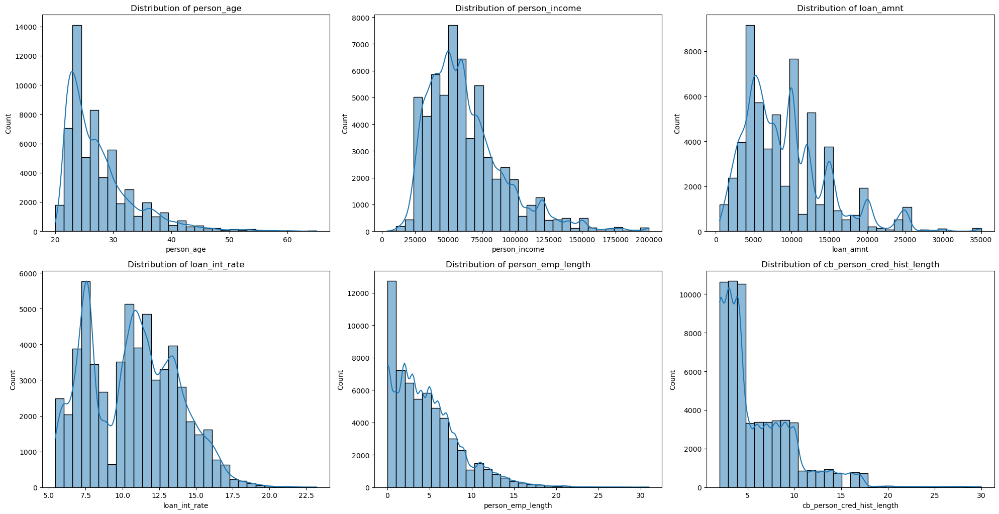

In [52]:
features = ['person_age', 'person_income', 'loan_amnt', 'loan_int_rate','person_emp_length','cb_person_cred_hist_length']
plt.figure(figsize=(20, 15))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df_copy[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

## observation
- The majority of borrowers fall into the 20-30 age group, indicating younger to middle-aged individuals dominate the dataset.
- Loan amounts are skewed toward lower values, with most requests under $15,000.
- most of them have person income from 25000 to 100000 
- most of them have emp_length lower than 15, higther from(0 to 5)

In [53]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

Number_of_loan_intent_and_loan_status

In [26]:
Number_of_loan_intent_and_loan_status = px.bar(df_copy.groupby([df_copy['loan_intent'], 'loan_status']).size().reset_index(name='count'), 
                                      x='loan_intent', y='count', color='loan_status', 
                                      title='Number of loan_status and loan_intent')
Number_of_loan_intent_and_loan_status.update_xaxes(title_text='loan_status')
Number_of_loan_intent_and_loan_status.update_yaxes(title_text='loan_status')
Number_of_loan_intent_and_loan_status.update_traces(text=df_copy.groupby([df_copy['loan_intent'], 'loan_status']).size().reset_index(name='count')['count'], textposition='outside', 
                                           )
Number_of_loan_intent_and_loan_status.show()

## observation
- EDUCATION have higher count when loan status =0
- MEDICAL AND DEPTCONSOLDATION have higher count when loan status =1

Number_of_loan_grade_and_loan_status

In [27]:
groupe_Number_of_loan_grade_and_loan_status= df_copy.groupby(['loan_grade', 'loan_status']).size().reset_index(name='count')

print(groupe_Number_of_loan_grade_and_loan_status)
Number_of_loan_grade_and_loan_status= px.bar(groupe_Number_of_loan_grade_and_loan_status, 
                                      x='loan_grade', y='count', color='loan_status', 
                                      title='Number of loan_status and loan_grade')
Number_of_loan_grade_and_loan_status.update_xaxes(title_text='loan_status')
Number_of_loan_grade_and_loan_status.update_yaxes(title_text='loan_status')
Number_of_loan_grade_and_loan_status.update_traces(text=df_copy.groupby([df_copy['loan_grade'], 'loan_status']).size().reset_index(name='count')['count'], textposition='outside', 
                                           )
Number_of_loan_grade_and_loan_status.show()

   loan_grade  loan_status  count
0           A            0  19865
1           A            1   1030
2           B            0  18187
3           B            1   2082
4           C            0   9494
5           C            1   1491
6           D            0   2040
7           D            1   2980
8           E            0    375
9           E            1    630
10          F            0     57
11          F            1     91
12          G            0      6
13          G            1     27


Box plot to show the relationship between loan grade and interest rate

C:\Users\USER\AppData\Local\Temp\ipykernel_9388\337590386.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




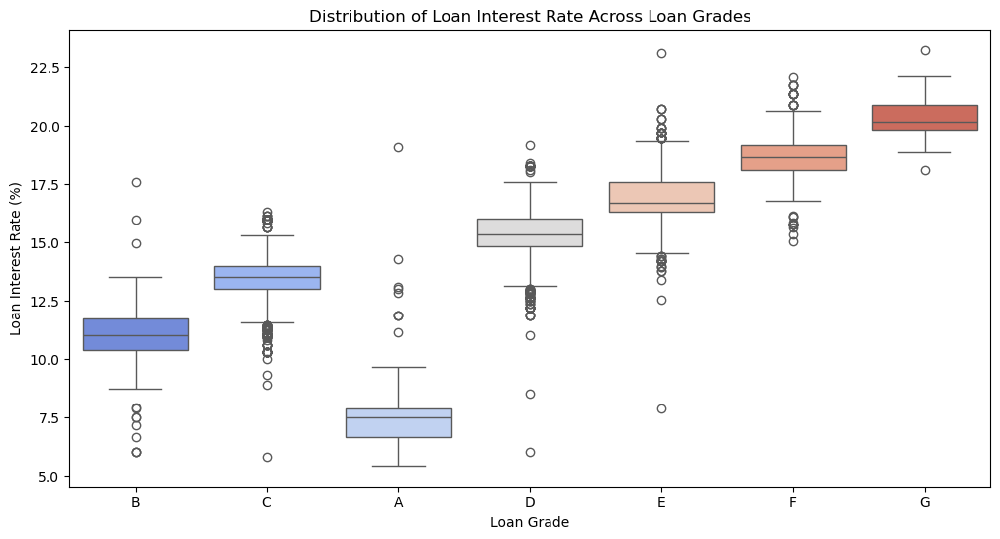

In [28]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_copy, x='loan_grade', y='loan_int_rate', palette='coolwarm')
plt.title('Distribution of Loan Interest Rate Across Loan Grades')
plt.xlabel('Loan Grade')
plt.ylabel('Loan Interest Rate (%)')
plt.show()


In [29]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [30]:
D_loan_grade_on_payment=df_copy[df_copy['loan_grade']=='D']
D_loan_grade_on_payment.groupby(['loan_grade', 'person_age','loan_amnt','person_home_ownership']).size().reset_index(name='count')

,loan_grade,person_age,loan_amnt,person_home_ownership,count
0,D,20,24250,MORTGAGE,1
1,D,20,28250,RENT,1
2,D,21,1000,MORTGAGE,1
3,D,21,1000,OWN,1
4,D,21,1000,RENT,2
...,...,...,...,...,...
1917,D,62,3000,RENT,1
1918,D,64,2500,RENT,1
1919,D,64,9600,RENT,1
1920,D,65,12000,MORTGAGE,1


In [31]:
D_loan_grade_on_payment['person_home_ownership'].value_counts()

person_home_ownership
RENT        3209
MORTGAGE    1502
OWN          299
OTHER         10
Name: count, dtype: int64

In [32]:
A_loan_grade_on_payment=df_copy[df_copy['loan_grade']=='A']
A_loan_grade_on_payment['person_home_ownership'].value_counts()

person_home_ownership
MORTGAGE    11513
RENT         8223
OWN          1138
OTHER          21
Name: count, dtype: int64

In [33]:
C_loan_grade_on_payment=df_copy[df_copy['loan_grade']=='C']
C_loan_grade_on_payment['person_home_ownership'].value_counts()

person_home_ownership
RENT        6944
MORTGAGE    3443
OWN          582
OTHER         16
Name: count, dtype: int64

In [34]:
B_loan_grade_on_payment=df_copy[df_copy['loan_grade']=='B']
B_loan_grade_on_payment['person_home_ownership'].value_counts()


person_home_ownership
RENT        11367
MORTGAGE     7805
OWN          1058
OTHER          39
Name: count, dtype: int64

In [35]:
No_defaulting_on_payment=df_copy[df_copy['cb_person_default_on_file']=='N']
No_defaulting_on_payment.groupby(['loan_grade', 'loan_status']).size().reset_index(name='count')

,loan_grade,loan_status,count
0,A,0,19861
1,A,1,1030
2,B,0,18181
3,B,1,2082
4,C,0,4727
5,C,1,769
6,D,0,968
7,D,1,1486
8,E,0,185
9,E,1,317


## observation
relationship between loan grade and default history

C:\Users\USER\AppData\Local\Temp\ipykernel_9388\1174615621.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




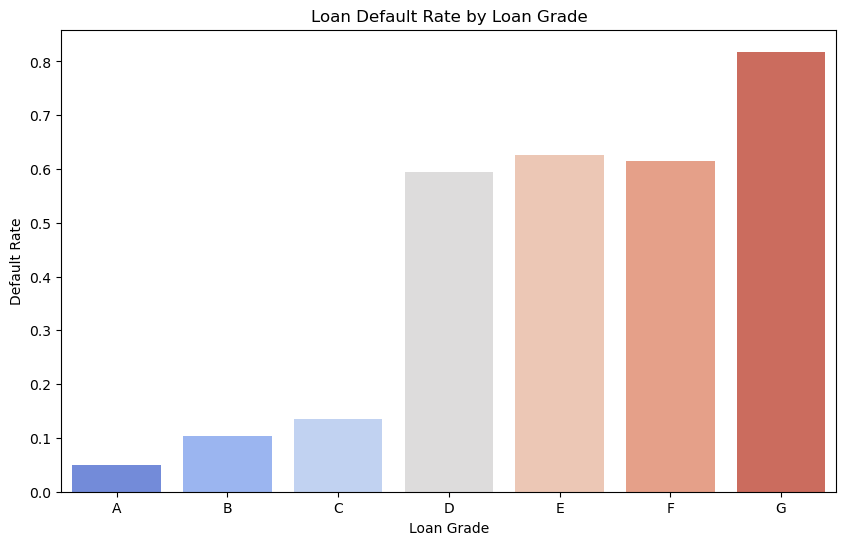

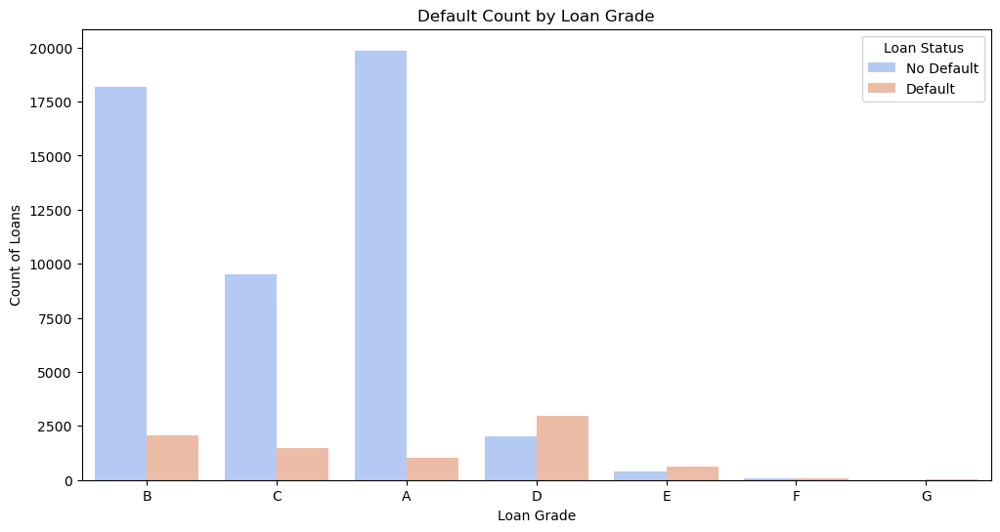

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


loan_grade_default_rate = df_copy.groupby('loan_grade')['loan_status'].mean().reset_index()

# Plot the default rate by loan grade
plt.figure(figsize=(10, 6))
sns.barplot(data=loan_grade_default_rate, x='loan_grade', y='loan_status', palette='coolwarm')
plt.title("Loan Default Rate by Loan Grade")
plt.xlabel("Loan Grade")
plt.ylabel("Default Rate")
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=df_copy, x='loan_grade', hue='loan_status', palette='coolwarm')
plt.title("Default Count by Loan Grade")
plt.xlabel("Loan Grade")
plt.ylabel("Count of Loans")
plt.legend(title="Loan Status", labels=["No Default", "Default"])
plt.show()


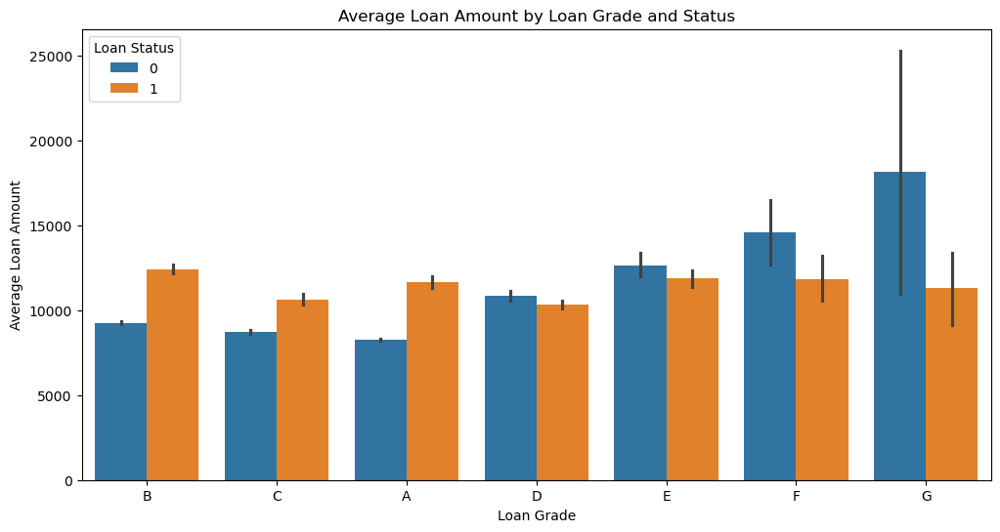

In [37]:
plt.figure(figsize=(12, 6))
sns.barplot(x='loan_grade', y='loan_amnt', hue='loan_status', data=df_copy, estimator=np.mean)
plt.title('Average Loan Amount by Loan Grade and Status')
plt.xlabel('Loan Grade')
plt.ylabel('Average Loan Amount')
plt.legend(title='Loan Status')
plt.show()

## observation
- Higher grades (A, B) should have lower interest rates
- Lower grades (E, F, G) are expected to have higher interest rates ,because higher  defaulting
- D is higher aproved loan because have person_home_ownership  rent and mortage higher ration
- Higher grades (A, B) should have lower default rates

In [38]:
grouped_data = df_copy.groupby(['person_home_ownership', 'loan_status']).size().reset_index(name='count')

# Print the grouped values
print("Grouped Data:")
print(grouped_data)

# Plot
Number_of_person_home_ownership_and_loan_status = px.bar(
    grouped_data, 
    x='person_home_ownership', 
    y='count', 
    color='loan_status', 
    title='Number of loan_status and person_home_ownership'
)

Number_of_person_home_ownership_and_loan_status.update_xaxes(title_text='Person Home Ownership')
Number_of_person_home_ownership_and_loan_status.update_yaxes(title_text='Loan Status Count')
Number_of_person_home_ownership_and_loan_status.update_traces(
    text=grouped_data['count'], 
    textposition='outside'
)
Number_of_person_home_ownership_and_loan_status.show()

Grouped Data:
  person_home_ownership  loan_status  count
0              MORTGAGE            0  23163
1              MORTGAGE            1   1480
2                 OTHER            0     73
3                 OTHER            1     15
4                   OWN            0   3081
5                   OWN            1     42
6                  RENT            0  23707
7                  RENT            1   6794


In [39]:
df.columns

Index(['id', 'person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [40]:
# Group and prepare the data
grouped_data = df_copy.groupby(['cb_person_default_on_file', 'loan_status']).size().reset_index(name='count')

# Print the grouped values
print("Grouped Data:")
print(grouped_data)
Number_of_fraud_and_typeofaction = px.bar(
    grouped_data, 
    x='cb_person_default_on_file', 
    y='count', 
    color='loan_status', 
    title='Number of cb_person_default_on_file and person_home_ownership'
)

Number_of_fraud_and_typeofaction.update_xaxes(title_text='cb person default on file')
Number_of_fraud_and_typeofaction.update_yaxes(title_text='Loan Status Count')
Number_of_fraud_and_typeofaction.update_traces(
    text=grouped_data['count'], 
    textposition='outside'
)
Number_of_fraud_and_typeofaction.show()

Grouped Data:
  cb_person_default_on_file  loan_status  count
0                         N            0  43954
1                         N            1   5734
2                         Y            0   6070
3                         Y            1   2597


# obervation
- Individuals with a history of defaults (cb_person_default_on_file = Y) have lower approval rates.
* Borrowers with no defaults (cb_person_default_on_file = N) have higher approval rates.

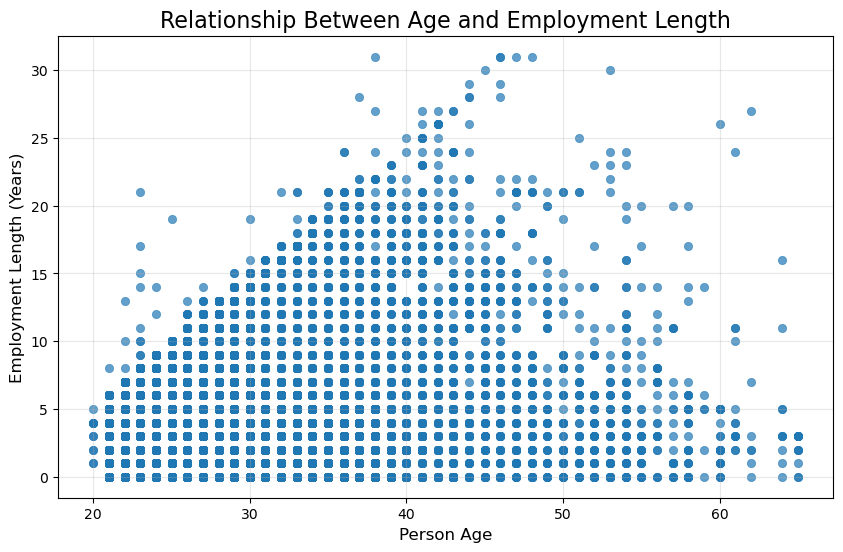

In [41]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_copy['person_age'],
    y=df_copy['person_emp_length'],
    alpha=0.7,
    edgecolor=None
)
plt.title("Relationship Between Age and Employment Length", fontsize=16)
plt.xlabel("Person Age", fontsize=12)
plt.ylabel("Employment Length (Years)", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

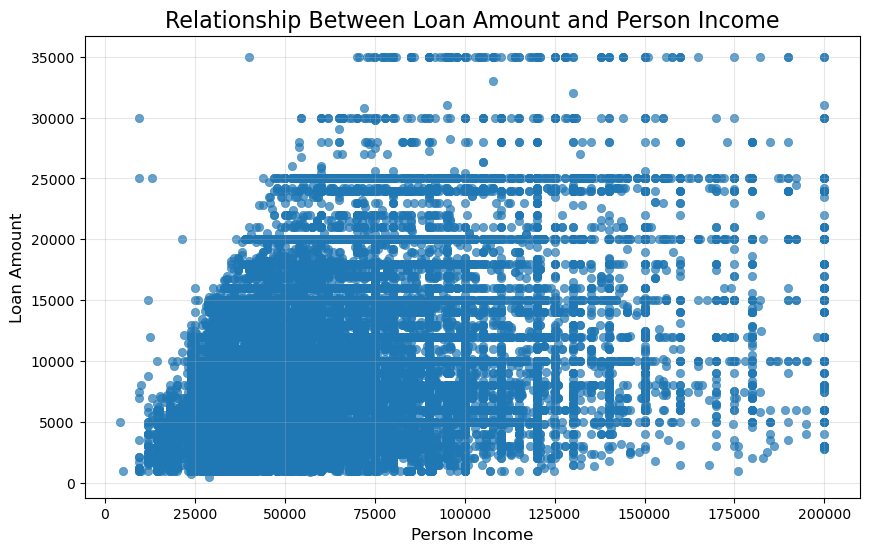

In [42]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_copy['person_income'],
    y=df_copy['loan_amnt'],
    alpha=0.7,
    edgecolor=None
)
plt.title("Relationship Between Loan Amount and Person Income", fontsize=16)
plt.xlabel("Person Income", fontsize=12)
plt.ylabel("Loan Amount", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()


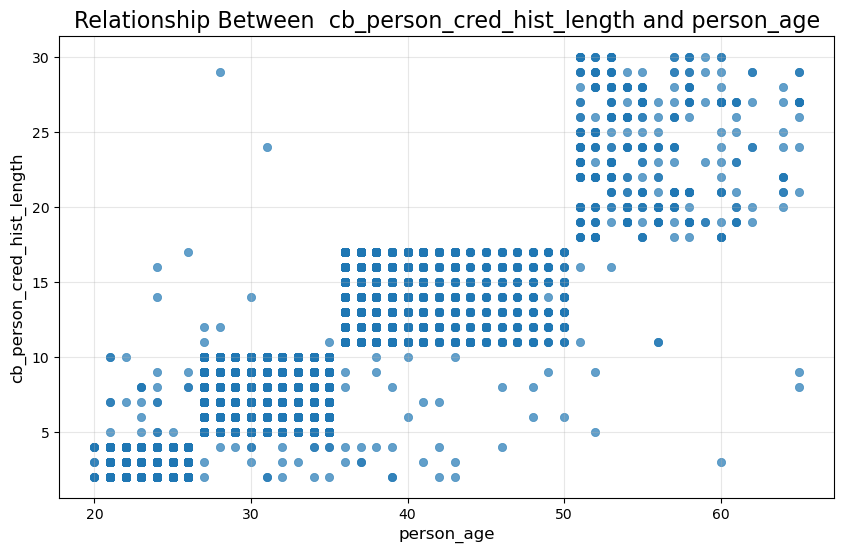

In [43]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_copy["person_age"],
    y=df_copy['cb_person_cred_hist_length'],
    alpha=0.7,
    edgecolor=None
)
plt.title("Relationship Between  cb_person_cred_hist_length and person_age", fontsize=16)
plt.xlabel("person_age", fontsize=12)
plt.ylabel("cb_person_cred_hist_length", fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

In [44]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

# observation
- positive Correlation between person_age and requested cb_person_cred_hist_length.
- positive Correlation between income and requested loan amount.
- positive Correlation between Age and requested emplolyment length.

In [45]:
defaulting_on_payment=df_copy[df_copy['cb_person_default_on_file']=='Y']


In [46]:
grouped_data = defaulting_on_payment.groupby(['person_home_ownership', 'loan_status']).size().reset_index(name='count')

# Sort the grouped data by the 'count' column in descending order
sorted_grouped_data = grouped_data.sort_values(by='count', ascending=False)

# Print the sorted values
print("Sorted Grouped Data:")
print(sorted_grouped_data)


Sorted Grouped Data:
  person_home_ownership  loan_status  count
6                  RENT            0   3470
0              MORTGAGE            0   2121
7                  RENT            1   2054
1              MORTGAGE            1    523
4                   OWN            0    467
5                   OWN            1     17
2                 OTHER            0     12
3                 OTHER            1      3


In [47]:
grouped_data = defaulting_on_payment.groupby(['loan_intent', 'loan_status']).size().reset_index(name='count')
sorted_grouped_data = grouped_data.sort_values(by='count', ascending=False)
print("Sorted Grouped Data:")
print(sorted_grouped_data)

Sorted Grouped Data:
          loan_intent  loan_status  count
2           EDUCATION            0   1500
8            PERSONAL            0   1097
10            VENTURE            0   1082
6             MEDICAL            0    968
0   DEBTCONSOLIDATION            0    723
4     HOMEIMPROVEMENT            0    700
7             MEDICAL            1    615
1   DEBTCONSOLIDATION            1    565
9            PERSONAL            1    379
5     HOMEIMPROVEMENT            1    368
3           EDUCATION            1    361
11            VENTURE            1    309


In [48]:
# Group and prepare the data
grouped_data = defaulting_on_payment.groupby(['loan_grade']).size().reset_index(name='count')
print(grouped_data)

  loan_grade  count
0          A      4
1          B      6
2          C   5489
3          D   2566
4          E    503
5          F     81
6          G     18


In [304]:
# df_copy['risk_score'] = df_copy['loan_grade'] / (df_copy['loan_int_rate'] + 1e-5)
# df_copy['income_stability'] = df_copy['person_income'] * df_copy['person_emp_length']    

In [47]:
# Disposable Income
df_copy['disposable_income'] = df_copy['person_income'] - (df_copy['loan_amnt'] * (1 + df_copy['loan_int_rate']))

# Preview the dataset to check the new column
print(df_copy[['person_income', 'loan_amnt', 'loan_int_rate', 'disposable_income']].head())

   person_income  loan_amnt  loan_int_rate  disposable_income
0          35000       6000          11.49           -39940.0
1          56000       4000          13.35            -1400.0
2          28800       6000           8.90           -30600.0
3          70000      12000          11.11           -75320.0
4          60000       6000           6.92            12480.0


In [48]:
# Employment Stability
def employment_stability(emp_length):
    if emp_length < 5:
        return 'Unstable'
    elif 5 <= emp_length <= 10:
        return 'Relatively Stable'
    else:
        return 'Highly Stable'

df_copy['employment_stability'] = df_copy['person_emp_length'].apply(employment_stability)

print(df_copy[['person_emp_length', 'employment_stability']].head())

   person_emp_length employment_stability
0                0.0             Unstable
1                6.0    Relatively Stable
2                8.0    Relatively Stable
3               14.0        Highly Stable
4                2.0             Unstable


In [51]:
df_copy = df_copy.drop(columns=['person_emp_length'])  # not useful

In [52]:
df_copy = df_copy.drop(columns=['cb_person_cred_hist_length'])  # not useful

In [49]:
def credit_history_stability(hist_length):
    if hist_length < 5:
        return 'Short'
    elif 5 <= hist_length <= 10:
        return 'Medium'
    else:
        return 'Long'

df_copy['credit_history_stability'] = df_copy['cb_person_cred_hist_length'].apply(credit_history_stability)

print(df_copy[['cb_person_cred_hist_length', 'credit_history_stability']].head())

   cb_person_cred_hist_length credit_history_stability
0                          14                     Long
1                           2                    Short
2                          10                   Medium
3                           5                   Medium
4                           3                    Short


In [50]:
df_copy['income_credit_interaction'] = df_copy['person_income'] * df_copy['cb_person_cred_hist_length']

print(df_copy[['person_income', 'cb_person_cred_hist_length', 'income_credit_interaction']].head())

   person_income  cb_person_cred_hist_length  income_credit_interaction
0          35000                          14                     490000
1          56000                           2                     112000
2          28800                          10                     288000
3          70000                           5                     350000
4          60000                           3                     180000


# <span style="color:skyblue">3- Data preprocessing </span>

3.1 encoding of categorical value

In [53]:
label_encoder = LabelEncoder()
columns_to_encode = df_copy.select_dtypes(exclude=['number'])
for column in columns_to_encode:
    df_copy[column] = label_encoder.fit_transform(df_copy[column])

In [54]:
df_copy.head(5)

,person_age,person_income,person_home_ownership,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,loan_status,disposable_income,employment_stability,credit_history_stability,income_credit_interaction
0,37,35000,3,1,1,6000,11.49,0.17,0,0,-39940.0,2,0,490000
1,22,56000,2,3,2,4000,13.35,0.07,0,0,-1400.0,1,2,112000
2,29,28800,2,4,0,6000,8.90,0.21,0,0,-30600.0,1,1,288000
3,30,70000,3,5,1,12000,11.11,0.17,0,0,-75320.0,0,1,350000
4,22,60000,3,3,0,6000,6.92,0.10,0,0,12480.0,2,2,180000


In [55]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership', 'loan_intent',
       'loan_grade', 'loan_amnt', 'loan_int_rate', 'loan_percent_income',
       'cb_person_default_on_file', 'loan_status', 'disposable_income',
       'employment_stability', 'credit_history_stability',
       'income_credit_interaction'],
      dtype='object')

3.2 scalling 

In [56]:
from sklearn.preprocessing import StandardScaler
columns_to_scale = ['person_age', 'person_income', 
                    'loan_amnt', 'loan_int_rate', 'loan_percent_income'
                   
       ]

scaler = StandardScaler()
df_copy[columns_to_scale] = scaler.fit_transform(df_copy[columns_to_scale])


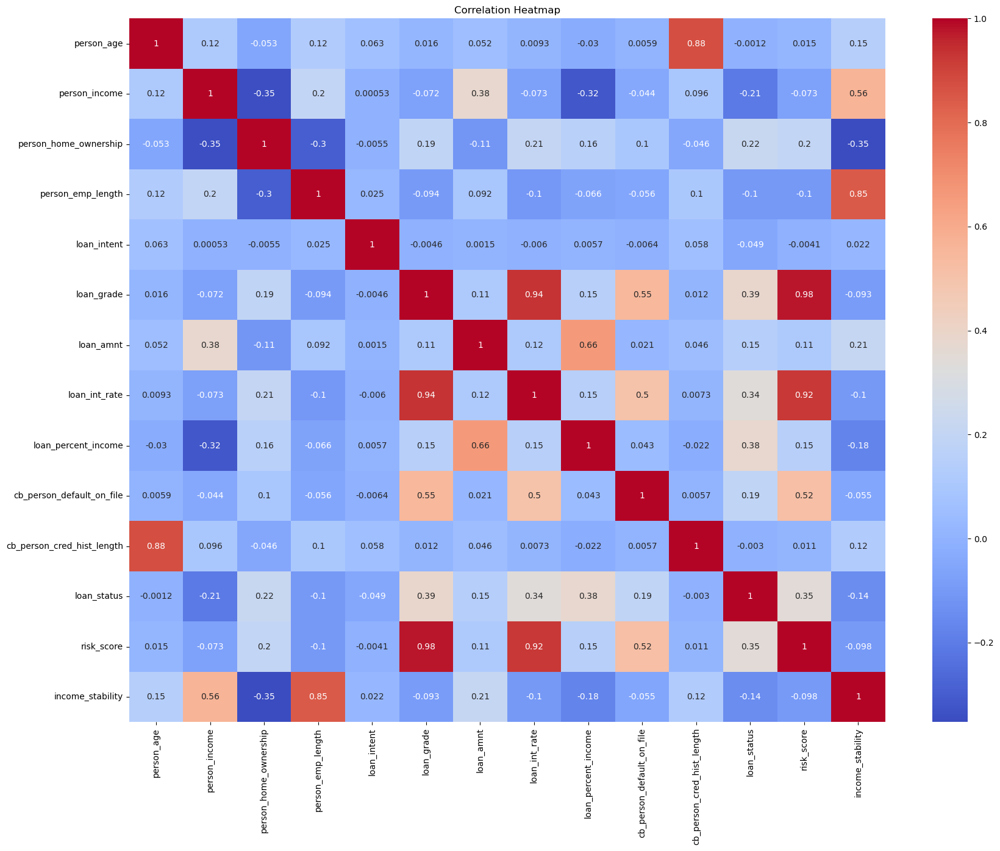

In [39]:
numeric_df = df_copy.select_dtypes(include=['number'])
plt.figure(figsize=(20, 15))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [30]:
df_copy.corr()['loan_status'].sort_values(ascending=False) 

loan_status                  1.000000
loan_grade                   0.386219
loan_percent_income          0.377797
loan_int_rate                0.339259
person_home_ownership        0.219712
cb_person_default_on_file    0.187289
loan_amnt                    0.147621
employment_stability         0.101329
person_age                  -0.001181
loan_intent                 -0.049124
income_credit_interaction   -0.107891
person_income               -0.207306
disposable_income           -0.342482
Name: loan_status, dtype: float64

In [113]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status', 'risk_score',
       'income_stability'],
      dtype='object')

# <span style="color:skyblue">3-Data Split</span>

In [31]:
df_copy.columns

Index(['person_age', 'person_income', 'person_home_ownership', 'loan_intent',
       'loan_grade', 'loan_amnt', 'loan_int_rate', 'loan_percent_income',
       'cb_person_default_on_file', 'loan_status', 'disposable_income',
       'employment_stability', 'income_credit_interaction'],
      dtype='object')

In [69]:
x=df_copy[['person_age', 'person_income', 'person_home_ownership',
        'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
      
       'disposable_income', 'employment_stability',
       'credit_history_stability', 'income_credit_interaction']]
y=df_copy[['loan_status']]

# <span style="color:skyblue">3-Modeling
</span>

In [91]:
smote = SMOTEENN(sampling_strategy=0.25,random_state=42)
X_resampled, y_resampled = smote.fit_resample(x,y)    
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=101)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

# DTree

Train Accuracy: 0.9792
Test Accuracy: 0.9756
------------------------------------------------------------------------------------------------------------------

Confusion Matrix:
[[7258   65]
 [ 126  392]]
------------------------------------------------------------------------------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      7323
           1       0.86      0.76      0.80       518

    accuracy                           0.98      7841
   macro avg       0.92      0.87      0.90      7841
weighted avg       0.97      0.98      0.97      7841

------------------------------------------------------------------------------------------------------------------


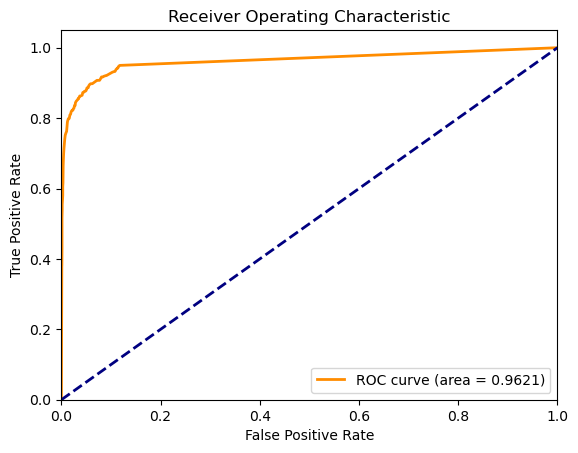

In [92]:
DTree = DecisionTreeClassifier(max_depth=40,  # Limit depth of the tree
    min_samples_split=50,  # Minimum samples required to split a node
    min_samples_leaf=30,
    random_state=42)

DTree.fit(X_train, y_train)

# Train the model

DTree.fit(X_train, y_train)

# Make predictions
y_train_pred = DTree.predict(X_train)
y_test_pred = DTree.predict(X_test)

# Train accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
# Test accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Classification report
class_report = classification_report(y_test, y_test_pred)


# Display the results
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print("------------------------------------------------------------------------------------------------------------------")
print("\nConfusion Matrix:")
print(conf_matrix)
print("------------------------------------------------------------------------------------------------------------------")
print("\nClassification Report:")
print(class_report)  
print("------------------------------------------------------------------------------------------------------------------")

y_prob =DTree.predict_proba(X_test)[:, 1]
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Random Forest

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Train Accuracy: 0.98
Test Accuracy: 0.98
------------------------------------------------------------------------------------------------------------------

Confusion Matrix:
[[7272   51]
 [ 145  373]]
------------------------------------------------------------------------------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      7323
           1       0.88      0.72      0.79       518

    accuracy                           0.98      7841
   macro avg       0.93      0.86      0.89      7841
weighted avg       0.97      0.98      0.97      7841

------------------------------------------------------------------------------------------------------------------


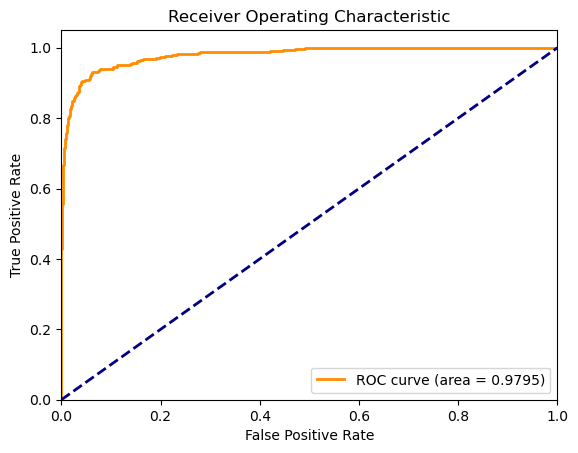

In [93]:
Rforest = RandomForestClassifier(
    max_depth=10,
   min_samples_split=60,  # Minimum samples required to split a node
    min_samples_leaf=50,
)                                                                                          

Rforest.fit(X_train, y_train)


# Make predictions
y_train_predRforest = Rforest.predict(X_train)
y_test_predRforest = Rforest.predict(
    X_test)

# Train accuracy
train_accuracy = accuracy_score(y_train, y_train_predRforest)
# Test accuracy
test_accuracy = accuracy_score(y_test, y_test_predRforest)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_predRforest)

# Classification report
class_report = classification_report(y_test, y_test_predRforest)


# Display the results
print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")
print("------------------------------------------------------------------------------------------------------------------")
print("\nConfusion Matrix:")
print(conf_matrix)
print("------------------------------------------------------------------------------------------------------------------")
print("\nClassification Report:")
print(class_report)  

print("------------------------------------------------------------------------------------------------------------------")
y_prob =Rforest.predict_proba(X_test)[:, 1]
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Train Accuracy: 0.97
Test Accuracy: 0.97
------------------------------------------------------------------------------------------------------------------

Confusion Matrix:
[[7244   79]
 [ 170  348]]
------------------------------------------------------------------------------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      7323
           1       0.81      0.67      0.74       518

    accuracy                           0.97      7841
   macro avg       0.90      0.83      0.86      7841
weighted avg       0.97      0.97      0.97      7841

------------------------------------------------------------------------------------------------------------------


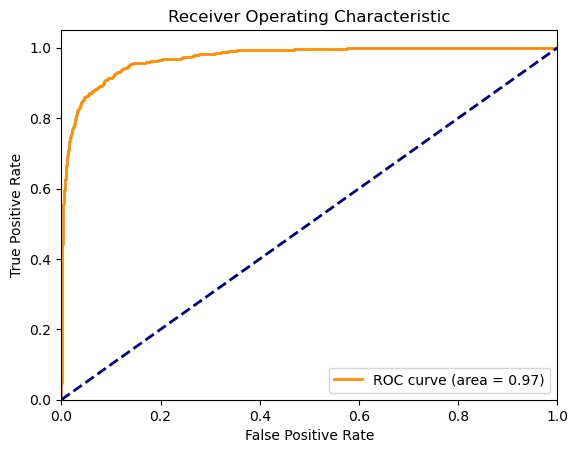

In [96]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report



Log = LogisticRegression(C=0.1,max_iter=5000,random_state=42)

# Train the model
Log.fit(X_train, y_train)

# Make predictions
y_train_pred_Log = Log.predict(X_train)
y_test_pred_Log = Log.predict(X_test)

# Train accuracy
train_accuracy = accuracy_score(y_train, y_train_pred_Log)
# Test accuracy
test_accuracy = accuracy_score(y_test, y_test_pred_Log)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred_Log)

# Classification report
class_report = classification_report(y_test, y_test_pred_Log)


# Display the results
print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")
print("------------------------------------------------------------------------------------------------------------------")
print("\nConfusion Matrix:")
print(conf_matrix) 
print("------------------------------------------------------------------------------------------------------------------")
print("\nClassification Report:")
print(class_report)  
print("------------------------------------------------------------------------------------------------------------------")
y_prob =Log.predict_proba(X_test)[:, 1]
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Knn

In [97]:
from sklearn.neighbors import KNeighborsClassifier
             
knn = KNeighborsClassifier(n_neighbors =3,weights='uniform')       
knn.fit(X_train, y_train)
y_predk = knn.predict(X_test)
y_train_pred = knn.predict(X_train)
# Test accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracyknn = accuracy_score(y_test, y_predk)
print(f"Test Accuracy: {test_accuracyknn:}")
print(f"Train Accuracy: {train_accuracy:.2f}")
print("----------------------------------------------")

cm = confusion_matrix(y_test, y_predk)
print("Confusion Matrix:")
print(cm)
print("----------------------------------------------")
print("\nClassification Report:")
print(classification_report(y_test, y_predk))

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Test Accuracy: 0.9849508991200102
Train Accuracy: 0.99
----------------------------------------------
Confusion Matrix:
[[7276   47]
 [  71  447]]
----------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      7323
           1       0.90      0.86      0.88       518

    accuracy                           0.98      7841
   macro avg       0.95      0.93      0.94      7841
weighted avg       0.98      0.98      0.98      7841



In [98]:

from sklearn.svm import SVC  # Import Support Vector Classifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

svm_model = SVC()  # You can change the kernel type as needed (linear, rbf, etc.)

# Train the model
svm_model.fit(X_train, y_train) 

# Make predictions on the test set
y_pred_train_svm = svm_model.predict(X_train)
y_predsvm = svm_model.predict(X_test)

# Calculate accuracy
# Train accuracy
train_accuracy_svc = accuracy_score(y_train, y_pred_train_svm)
# Test accuracy
test_accuracy_svc = accuracy_score(y_test, y_predsvm)

conf_matrix = confusion_matrix(y_test, y_predsvm)

# Classification report
class_report = classification_report(y_test, y_predsvm)                  

# Display the results
print(f"Train Accuracy: {train_accuracy_svc:.4f}")
print(f"Test Accuracy: {test_accuracy_svc:.4f}")
print("--------------------------------------------------------------------------------------------------")
print("\nConfusion Matrix:")
print(conf_matrix)
print("--------------------------------------------------------------------------------------------------")
print("\nClassification Report:")
print(class_report)  

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Train Accuracy: 0.9617
Test Accuracy: 0.9610
--------------------------------------------------------------------------------------------------

Confusion Matrix:
[[7278   45]
 [ 261  257]]
--------------------------------------------------------------------------------------------------

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      7323
           1       0.85      0.50      0.63       518

    accuracy                           0.96      7841
   macro avg       0.91      0.74      0.80      7841
weighted avg       0.96      0.96      0.96      7841



In [64]:
import pickle

In [65]:
pickle.dump(DTree, open('dtree.pkl','wb'))
model = pickle.load(open('dtree.pkl','rb'))
pickle.dump(Rforest, open('Rforest.pkl','wb'))
model = pickle.load(open('Rforest.pkl','rb'))
pickle.dump(Log, open('log.pkl','wb'))
model = pickle.load(open('log.pkl','rb'))
pickle.dump(svm_model, open('svm_model.pkl','wb'))
model = pickle.load(open('svm_model.pkl','rb'))

In [66]:
import os
print(os.getcwd())

c:\Users\USER\Desktop\loan
